In [13]:
import os

import numpy as np
from PIL import Image
from IPython.display import display

In [14]:
# img = Image.open(os.path.join(os.path.dirname(__file__), "bonus_secret_statement.png"))
img = Image.open(
    "\\\\wsl.localhost\\Debian\\home\\maverick\\repos\\project-euler\\secret\\first_secret\\bonus_secret_statement.png"
)

# Convert to grayscale
gray_img = img.convert("L")  # 'L' mode is 8-bit grayscale


In [15]:
# Get pixel data as numpy array (2D grid of uint8 values)
pixels = np.array(gray_img, dtype=np.uint8)


In [16]:
# Now pixels is a 2D array where each value is 0-255
print(f"Image shape: {pixels.shape}")  # (height, width)
print(f"Data type: {pixels.dtype}")  # uint8
print(f"Sample pixel at (0, 0): {pixels[0, 0]}")


Image shape: (585, 975)
Data type: uint8
Sample pixel at (0, 0): 253


In [17]:
# Access individual pixels: pixels[row, col]
# For example:
height, width = pixels.shape
for y in range(height):
    for x in range(width):
        pixel_value = pixels[y, x]  # 0-255
        print(pixel_value, end=' ')
    print()


253 255 254 249 253 250 255 253 253 252 19 116 251 251 253 255 254 250 251 249 251 251 249 252 253 254 249 253 254 145 54 253 254 250 250 253 249 252 255 254 253 251 251 170 21 254 255 250 255 250 253 249 255 253 249 255 254 255 252 249 255 250 254 254 250 252 255 253 254 252 251 253 255 255 251 252 253 253 253 254 251 251 249 251 255 249 253 250 254 255 250 252 254 255 251 253 252 255 253 253 250 255 250 254 252 249 255 250 252 255 250 253 252 251 253 250 251 255 255 251 254 252 252 252 255 253 251 251 250 255 251 249 251 249 255 255 251 251 255 253 249 255 254 252 250 251 250 252 146 51 254 251 252 250 255 254 230 14 198 254 255 252 254 249 250 255 252 249 252 255 255 249 253 251 254 254 253 249 253 255 224 18 20 110 253 252 253 252 255 254 250 253 252 254 173 19 254 251 170 21 254 249 255 252 255 254 249 249 253 253 251 252 255 253 251 254 253 249 251 250 252 253 251 255 83 52 252 250 249 255 252 252 252 255 252 253 251 254 252 250 253 251 253 253 253 250 252 249 250 251 249 252 252

In [18]:
def show_grid(array):
    # Scale 0-6 to 0-255 for visibility
    # We multiply by 42 because 6 * 42 = 252 (near max brightness)
    scaled_data = (array * 42).astype(np.uint8)
    img = Image.fromarray(scaled_data, mode="L")
    display(img)


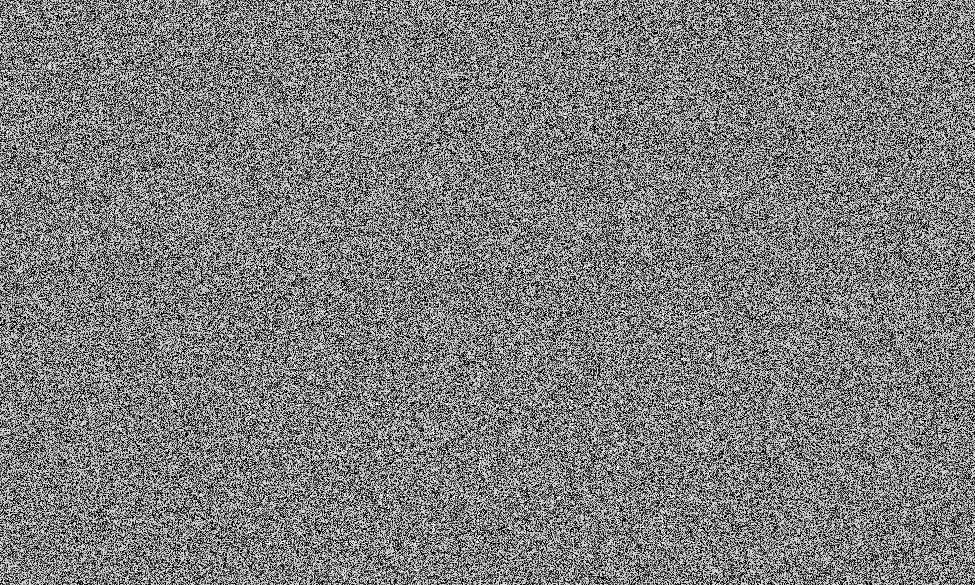

In [19]:
show_grid(pixels)

In [20]:
# Source - https://stackoverflow.com/a/28666223
# Posted by Salvador Dali, modified by community. See post 'Timeline' for change history
# Retrieved 2026-01-12, License - CC BY-SA 4.0
def numberToBase(n, b):
    if n == 0:
        return [0]
    digits = []
    while n:
        digits.append(int(n % b))
        n //= b
    return digits[::-1]


In [21]:
# Back when I would program simulations on Processing/p5js, I would do something like this (but now translated to python):
# new_pixels = copy.deepcopy(pixels)
# for y in range(height):
#     for x in range(width):
#         new_pixels[y, x] += (
#             pixels[(y - 1) % len(pixels), x]
#             + pixels[(y + 1) % len(pixels), x]
#             + pixels[y, (x - 1) % len(pixels[0])]
#             + pixels[y, (x + 1) % len(pixels[0])]
#         )


In [22]:
# Since we have to run this 10**12 times and view the pixels mod 7, we can do some change of bases trickery!
# First, let's just determine what 10**12 is in base 7:
digits = numberToBase(10**12, 7)
print(digits)

[1, 3, 2, 1, 5, 0, 6, 3, 4, 5, 1, 6, 0, 2, 1]


In [23]:
# Now, we can take a look at Frobenius Endomorphism (Thanks Gemini for the inspiration!)
# https://en.wikipedia.org/wiki/Frobenius_endomorphism
# We can use these digits as powers of 7 to effectively skip a lot of these steps.
# By converting 10**12 -> base 7, we can see that we now have a 15 digit number 132150634516021 base 7
# Which, with Frobenius Endomorphism, we can apply a shift her for 7**k for k in digits and k != 0

Result after step #0:


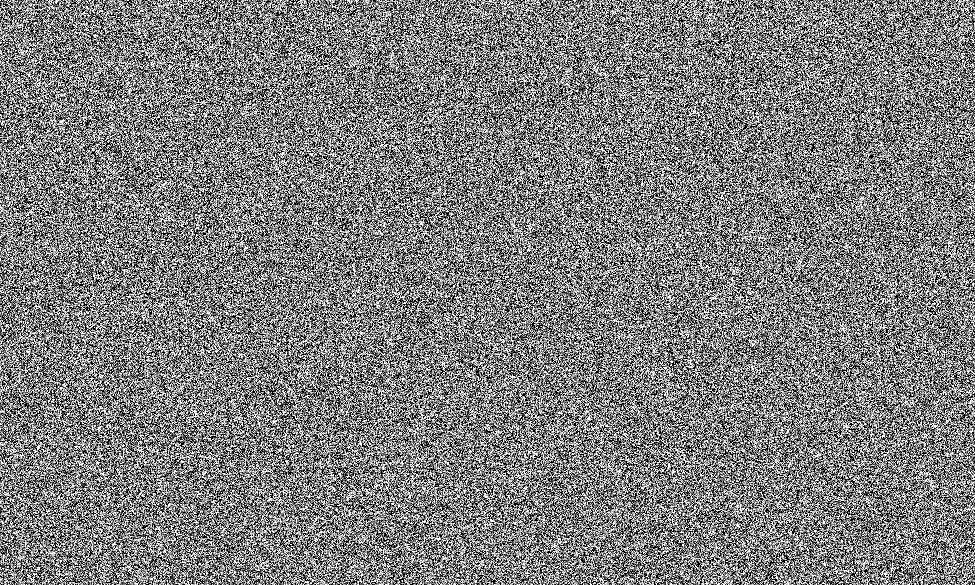

Result after step #1:


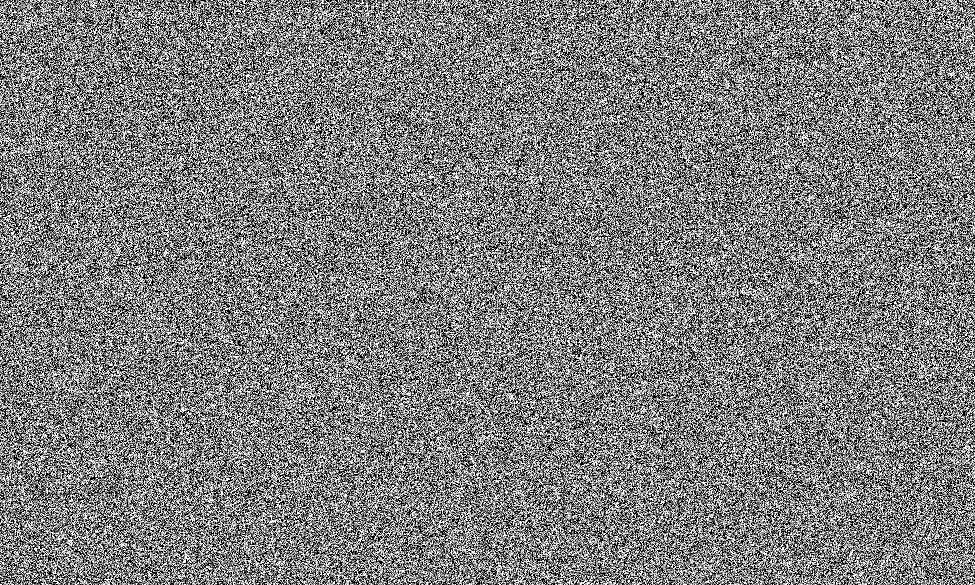

Result after step #3:


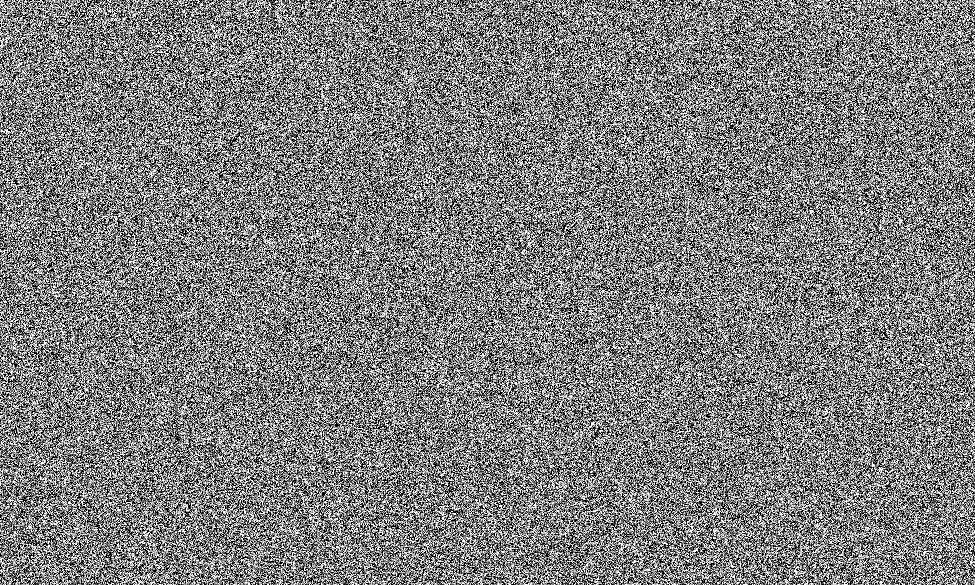

Result after step #4:


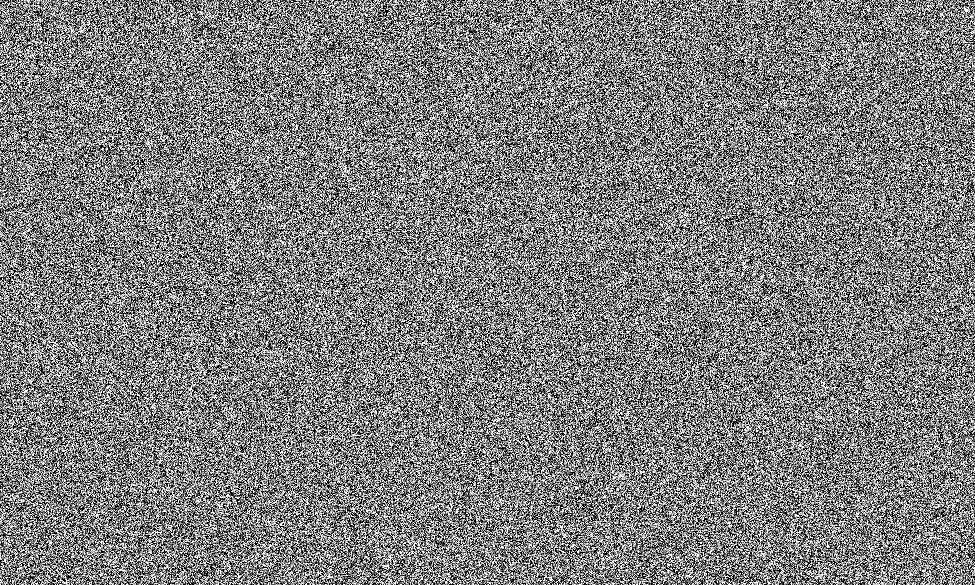

Result after step #5:


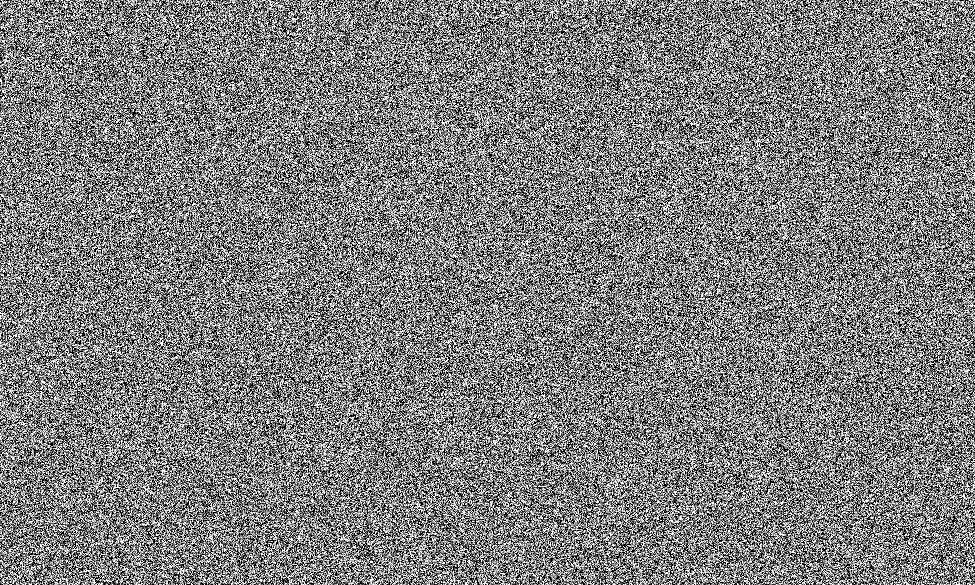

Result after step #6:


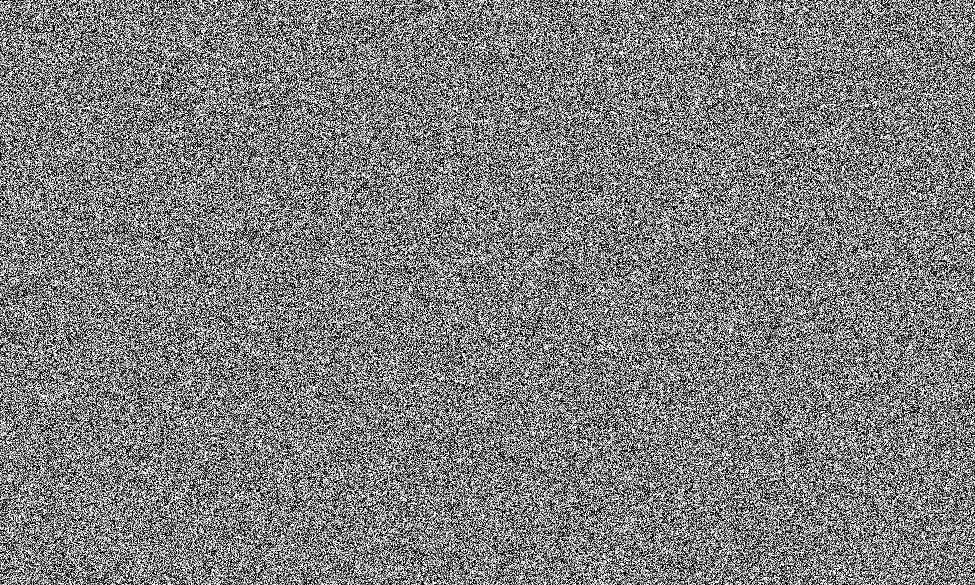

Result after step #7:


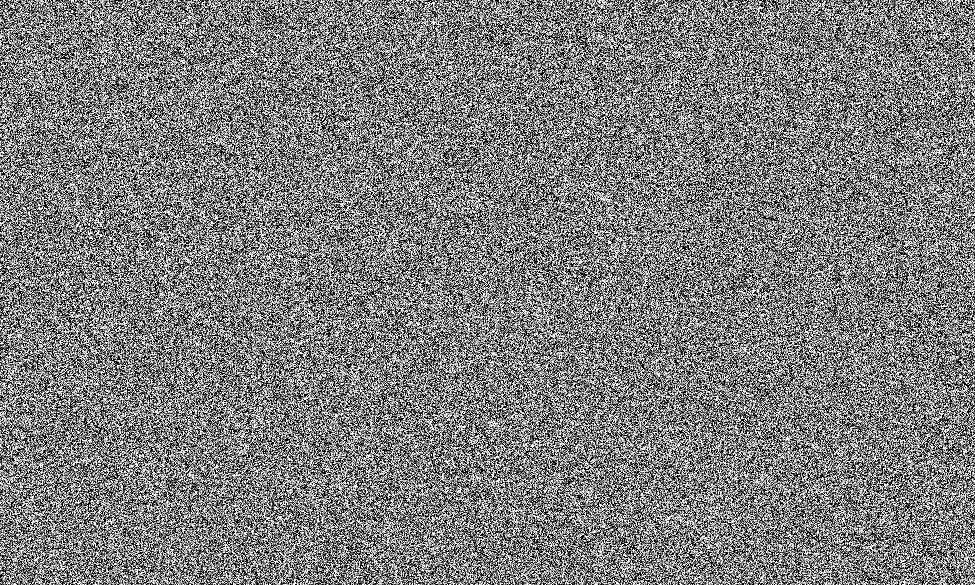

Result after step #8:


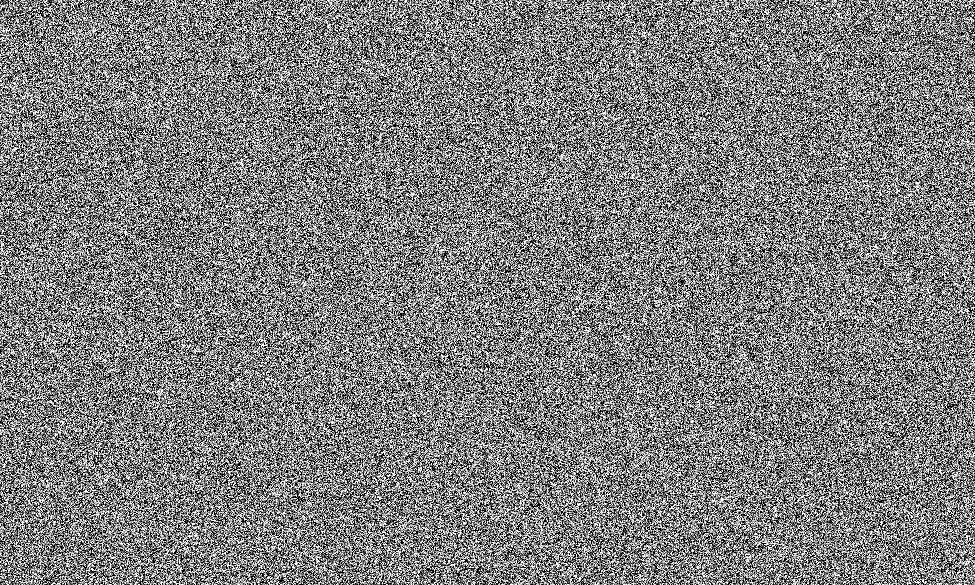

Result after step #10:


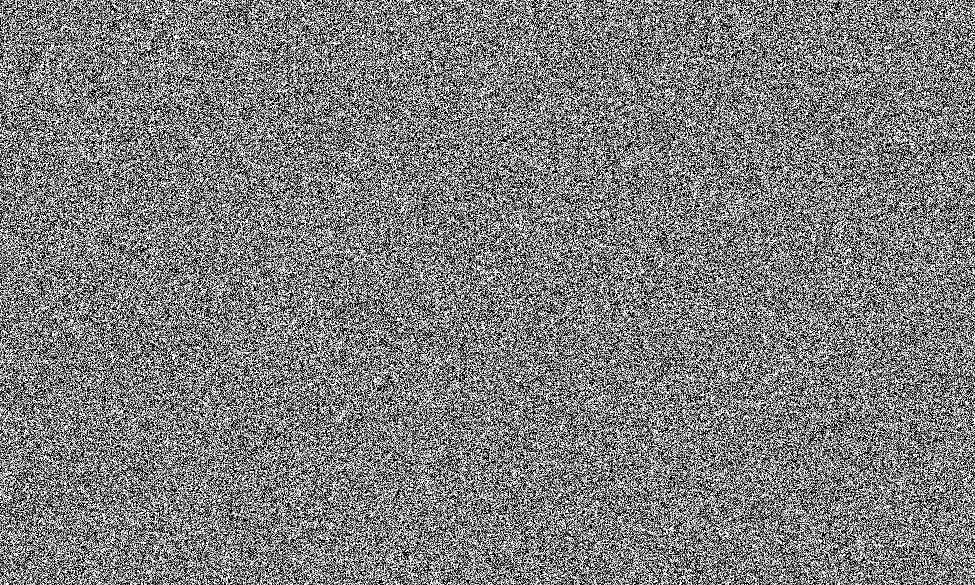

Result after step #11:


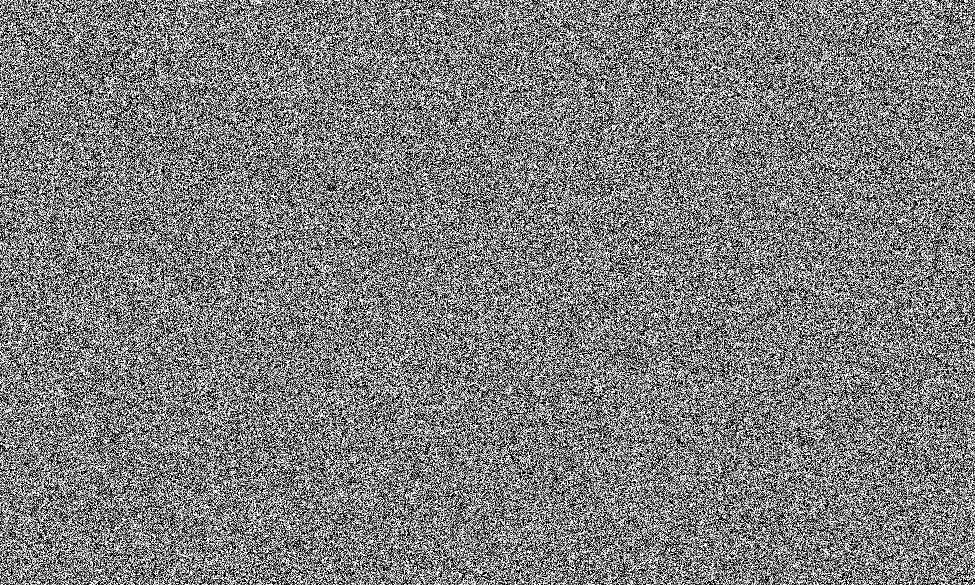

Result after step #12:


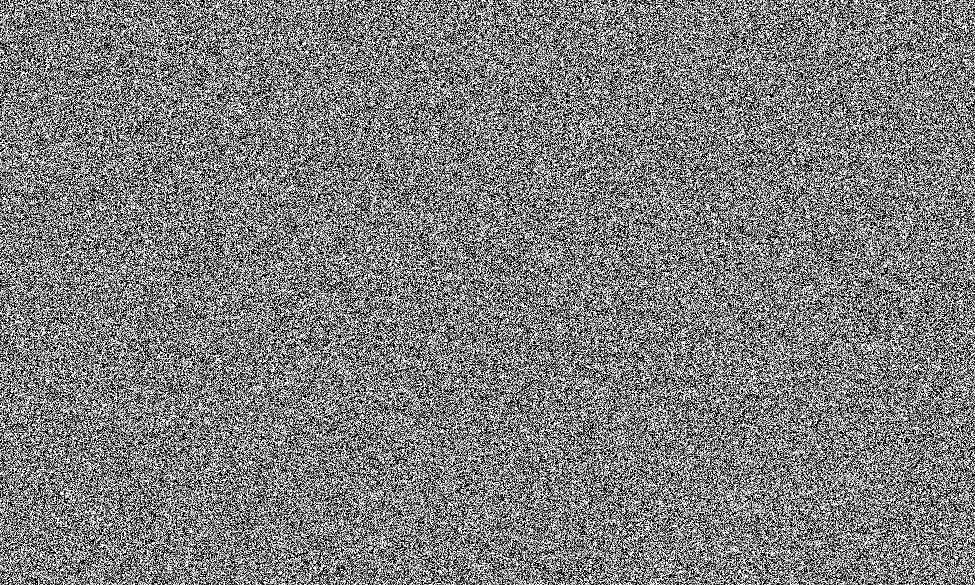

Result after step #13:


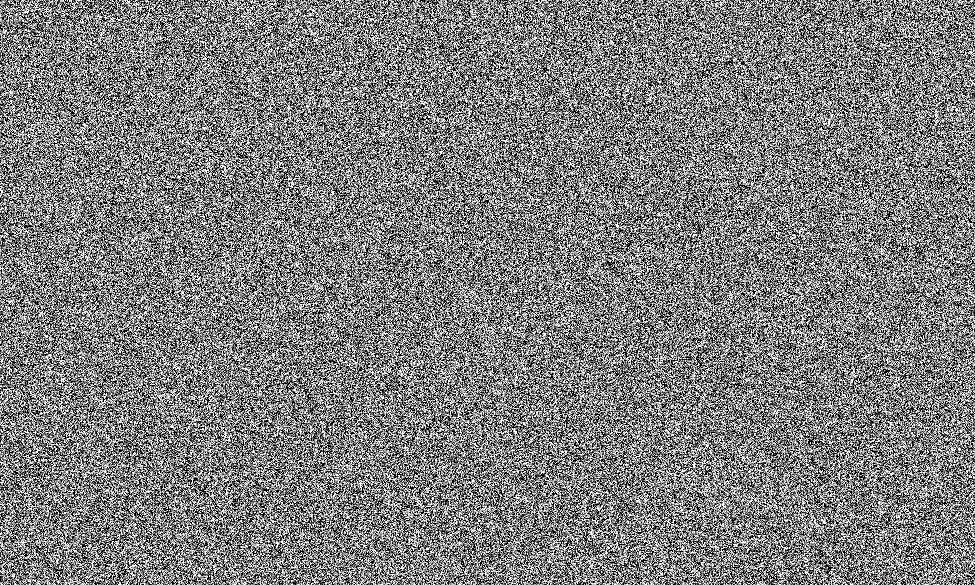

Result after step #14:


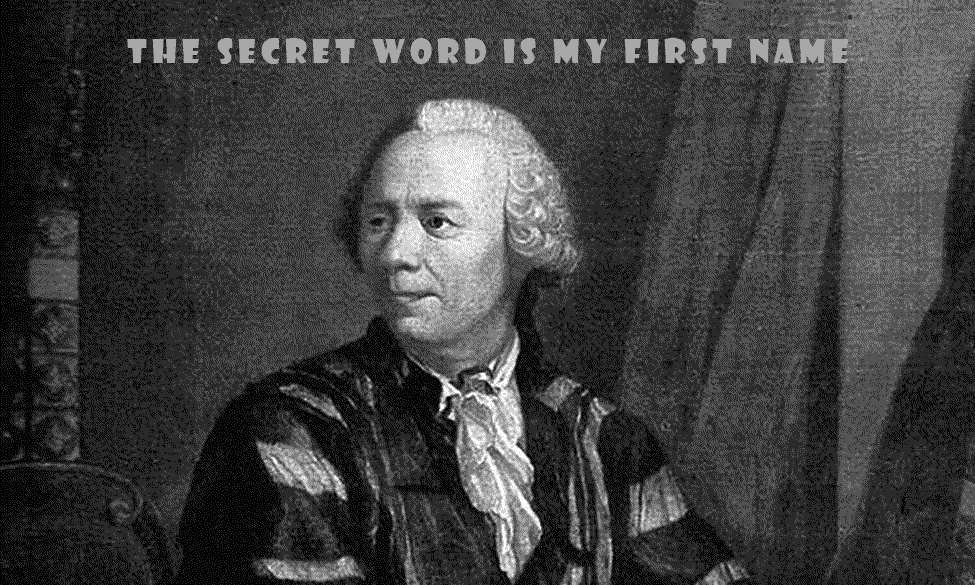

In [24]:
def apply_step(pixels, shift, rep):
    for _ in range(rep):
        pixels = (
            np.roll(pixels, -shift, axis=0)
            + np.roll(pixels, shift, axis=0)
            + np.roll(pixels, -shift, axis=1)
            + np.roll(pixels, shift, axis=1)
        ) % 7
    return pixels

current_pixels = pixels % 7
digits = digits[::-1] # flip the digits to be least to most significant.
for k, d in enumerate(digits):
    if d > 0:
        current_pixels = apply_step(current_pixels, 7**k, d)
        print(f"Result after step #{k}:")
        show_grid(current_pixels)